In [1]:
import xarray as xr
import matplotlib.pyplot as plt
from cartopy import crs, feature
import glob
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from matplotlib.gridspec import SubplotSpec
from __future__ import unicode_literals
from cartopy.io.shapereader import Reader
from cartopy.feature import ShapelyFeature
from cartopy.io import shapereader
lon_formatter = LongitudeFormatter(zero_direction_label=True)
lat_formatter = LatitudeFormatter()

In [2]:
lon_formatter = LongitudeFormatter(zero_direction_label=True)
lat_formatter = LatitudeFormatter()
bounds = [-3.3, 1.2, 4.5, 11.5]
def set_fig_params(axes):
    for i,j in enumerate(axes):
    # for i in (range(0,len(axes))):
        axes[i].set_extent(bounds)
        axes[i].add_feature(feature.COASTLINE)
        axes[i].add_feature(feature.BORDERS)
        axes[i].add_feature(feature.STATES, linewidth = 0.2)
        axes[i].set_xticks([-3,-2,-1,0,1.2], crs=crs.PlateCarree())
        axes[i].set_yticks([11,10,9,8,7,6], crs=crs.PlateCarree())
        lon_formatter = LongitudeFormatter(zero_direction_label=True)
        lat_formatter = LatitudeFormatter()
        axes[i].xaxis.set_major_formatter(lon_formatter)
        axes[i].yaxis.set_major_formatter(lat_formatter)
        
def create_subtitle(fig: plt.Figure, grid: SubplotSpec, title: str):
    row = fig.add_subplot(grid)
    row.set_title(f'{title}\n', fontweight='semibold')#) if row==1 else row.set_title(f'{title}')
    # if row==0 row.set_title(f'{title}\n\n\n', fontweight='semibold') else row.set_title(f'{title}\n'
    row.set_frame_on(False)
    row.axis('off')

In [3]:
path1 = '/media/kenz/1B8D1A637BBA134B/Data/calculated/'

In [4]:
#### Load data
mt_mpi = glob.glob(path1+'trans_MPI-M-MPI-ESM-LR_rcp*_GERICS-REMO2015_*.nc')
mt_nor = glob.glob(path1+'trans_NCC-NorESM1-M_rcp*_GERICS-REMO2015_*.nc')

In [5]:
mt_mpi

['/media/kenz/1B8D1A637BBA134B/Data/calculated/trans_MPI-M-MPI-ESM-LR_rcp26_GERICS-REMO2015_1991_2020.nc',
 '/media/kenz/1B8D1A637BBA134B/Data/calculated/trans_MPI-M-MPI-ESM-LR_rcp26_GERICS-REMO2015_2031_2060.nc',
 '/media/kenz/1B8D1A637BBA134B/Data/calculated/trans_MPI-M-MPI-ESM-LR_rcp26_GERICS-REMO2015_2061_2090.nc',
 '/media/kenz/1B8D1A637BBA134B/Data/calculated/trans_MPI-M-MPI-ESM-LR_rcp85_GERICS-REMO2015_1991_2020.nc',
 '/media/kenz/1B8D1A637BBA134B/Data/calculated/trans_MPI-M-MPI-ESM-LR_rcp85_GERICS-REMO2015_2031_2060.nc',
 '/media/kenz/1B8D1A637BBA134B/Data/calculated/trans_MPI-M-MPI-ESM-LR_rcp85_GERICS-REMO2015_2061_2090.nc']

In [6]:
# vec = xr.open_dataset(path1+'VECTRI_GHA-22_NCC-NorESM1-M_rcp26_r1RICS-REMO2015.nc')

In [5]:
vectri = glob.glob(path1+'VECTRI_GHA-22*.nc')

/tmp/ipykernel_14143/3259719976.py:13: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


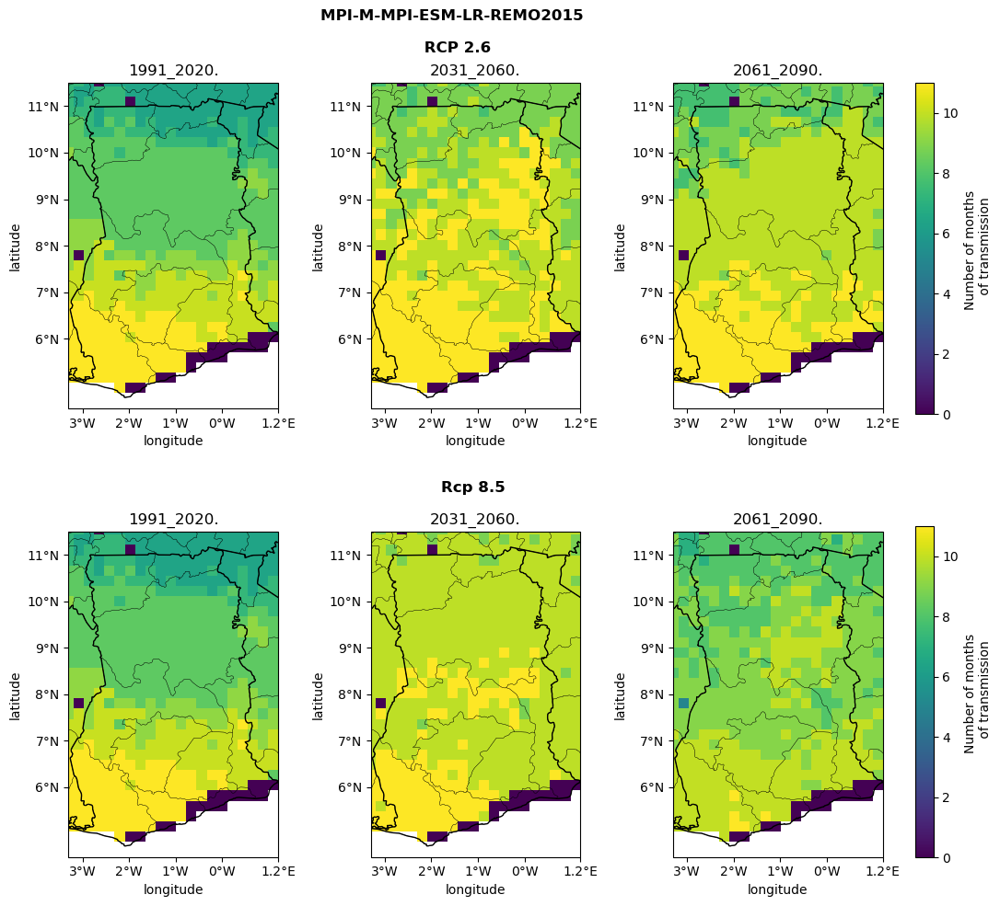

In [6]:
fig, ax = plt.subplots(2,3, figsize = (10,10),subplot_kw={'projection':crs.PlateCarree()})
ax = ax.flatten()
for i, j in enumerate(mt_mpi):
    cb = xr.open_dataset(j).eir.plot(ax = ax[i], add_colorbar = False)
    ax[i].set_title(j[-12:-2])
set_fig_params(ax)
grid = plt.GridSpec(2, 3)
create_subtitle(fig, grid[1, ::], 'Rcp 8.5 \n')
for i in [0.54,0.058]:
    cax = fig.add_axes([1,i,0.02, 0.36])
    fig.colorbar(cb, cax=cax, orientation='vertical', label='Number of months \n of transmission')
plt.suptitle('MPI-M-MPI-ESM-LR-REMO2015'+' \n \n RCP 2.6', fontweight = 'bold')
plt.tight_layout()

/tmp/ipykernel_14143/1251512739.py:13: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


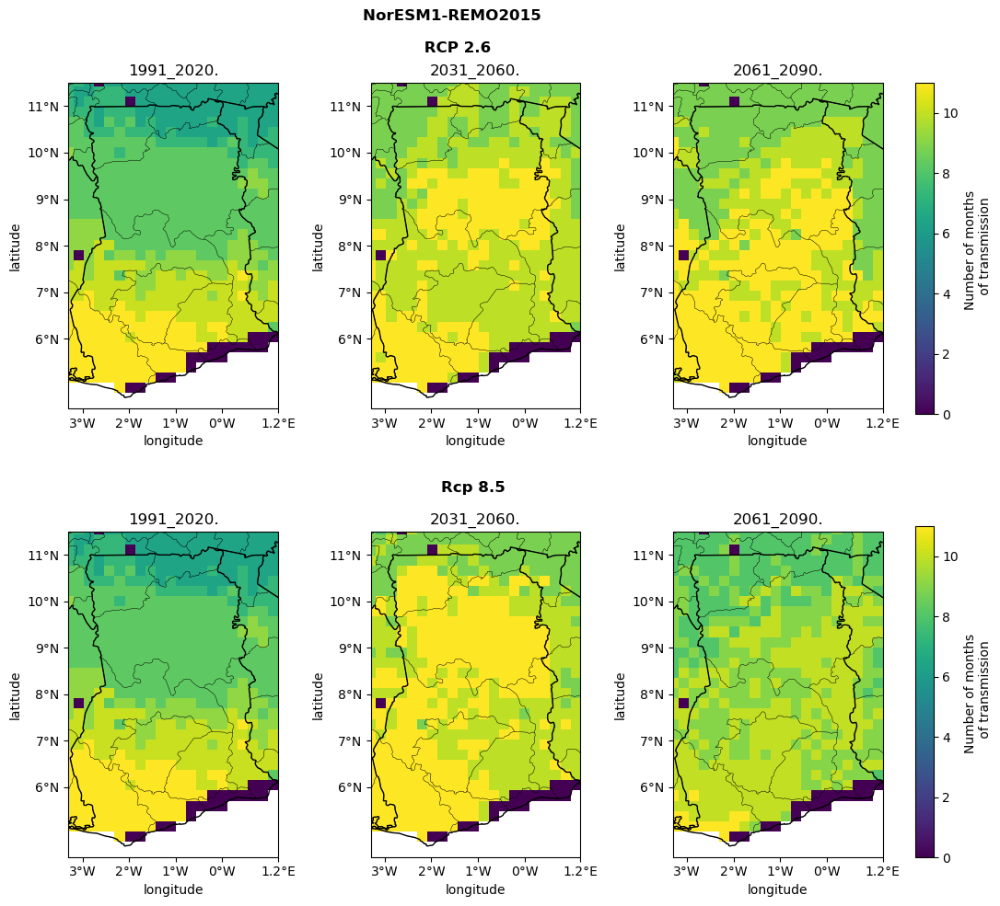

In [7]:
fig, ax = plt.subplots(2,3, figsize = (10,10),subplot_kw={'projection':crs.PlateCarree()})
ax = ax.flatten()
for i, j in enumerate(mt_nor):
    cb = xr.open_dataset(j).eir.plot(ax = ax[i], add_colorbar = False)
    ax[i].set_title(j[-12:-2])
set_fig_params(ax)
grid = plt.GridSpec(2, 3)
create_subtitle(fig, grid[1, ::], 'Rcp 8.5 \n')
for i in [0.54,0.058]:
    cax = fig.add_axes([1,i,0.02, 0.36])
    fig.colorbar(cb, cax=cax, orientation='vertical', label='Number of months \n of transmission')
plt.suptitle('NorESM1-REMO2015'+' \n \n RCP 2.6', fontweight = 'bold')
plt.tight_layout()

In [8]:
titles = ['Jan', 'Feb','Mar', 'Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
vec_m = vec.vector.sel(time = slice('1981','2021')).groupby('time.month').mean('time')*1000
fig, axes = plt.subplots(ncols = 4, nrows = 3, figsize=(10,10), subplot_kw={'projection':crs.PlateCarree()})
ax = axes.flatten()
for i in range(0,12):
    cb=ax[i].contourf(vec_m.longitude, vec_m.latitude, vec_m[i], cmap='jet', transform=crs.PlateCarree())
    ax[i].set_title(titles[i])
set_fig_params(ax)
for i in [0.68,0.36, 0.04]:
    cax = fig.add_axes([1,i,0.02, 0.25])
    fig.colorbar(cb, cax=cax, orientation='vertical', label='density $m^{-2}$)')
plt.suptitle('Vector Density 1990-2020',fontweight = 'bold')
plt.tight_layout()

NameError: name 'vec' is not defined

In [ ]:
dt = vec.eir.sel(time =slice('2031','2060'))#.resample(time = 'M').sum('time')#.groupby('time.month').mean('time').max()
dt# = dt.groupby('time.month').mean('time')


In [ ]:
# dt.where(dt.time.dt.month == 2)
 

In [82]:
ds = xr.open_dataset(vectri[0]).eir.sel(time =slice('2031','2060'))
ds.resample(time='M').sum('time').groupby('time.month').mean('time').max()

<xarray.DataArray 'eir' ()>
array(78.39888763)

In [ ]:
ds.

In [131]:
titles = ['Jan', 'Feb','Mar', 'Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
def _plt_(var):
    for i, j in enumerate(vectri):
        tta = ['1991','2031', '2061']
        ttb = ['2020','2060', '2090']
        for x in range(0,3):
            # data = xr.open_dataset(j)[var].sel(time = slice(tta[x],ttb[x])).groupby('time.month').mean('time')
            if var=='eir':
                data = xr.open_dataset(j)[var].sel(time = slice(tta[x],ttb[x])).resample(time = 'M').sum('time').groupby('time.month').mean('time')
            else:
                data = xr.open_dataset(j)[var].sel(time = slice(tta[x],ttb[x]))*1000
                data = data.resample(time ='M').sum('time').groupby('time.month').mean('time')
            # print(data.max())
            fig, axes = plt.subplots(ncols = 4, nrows = 3, figsize=(10,10), subplot_kw={'projection':crs.PlateCarree()})
            ax = axes.flatten()
            set_fig_params(ax)
            for z in range(0,12):
                cb=ax[z].contourf(data.longitude, data.latitude, data[z], cmap='jet', transform=crs.PlateCarree(), vmax = data.max())
                ax[z].set_title(titles[z])
                # cax = fig.add_axes([1,0.68,0.02, 0.25])
                # fig.colorbar(cb, cax=cax, orientation='vertical', label= f'{var}')#+' $m^{-2}$)')
                
            # for i in [0.68,0.36, 0.04]:
            #     cax = fig.add_axes([1,i,0.02, 0.25])
            #     fig.colorbar(cb, cax=cax, orientation='vertical', label= f'{var}')#+' $m^{-2}$)')
            # plt.tight_layout()
            # break
        # break
                # fig.colorbar(cb,shrink=0.8)
                
            # for i in [0.68,0.36, 0.04]:
            #     cax = fig.add_axes([1,i,0.02, 0.25])
            #     fig.colorbar(cb, cax=cax, orientation='vertical', label= f'{var}')#+' $m^{-2}$)')
            # plt.suptitle(f'{var}'+' ' +tta[x]+' - '+ttb[x],fontweight = 'bold')
            # plt.colorbar()
            
#             plt.suptitle(f'{var}'+' '+j[-41:-18]+tta[x]+'-'+ttb[x],fontweight = 'bold')
#             plt.tight_layout()
#             plt.savefig(path1+'figures/'+f'{var}'+'_'+j[-41:-18]+tta[x]+'-'+ttb[x]+'.jpeg', bbox_inches='tight')

/tmp/ipykernel_37532/2865206530.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_37532/2865206530.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_37532/2865206530.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_37532/2865206530.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_37532/2865206530.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_37532/2865206530.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results mig

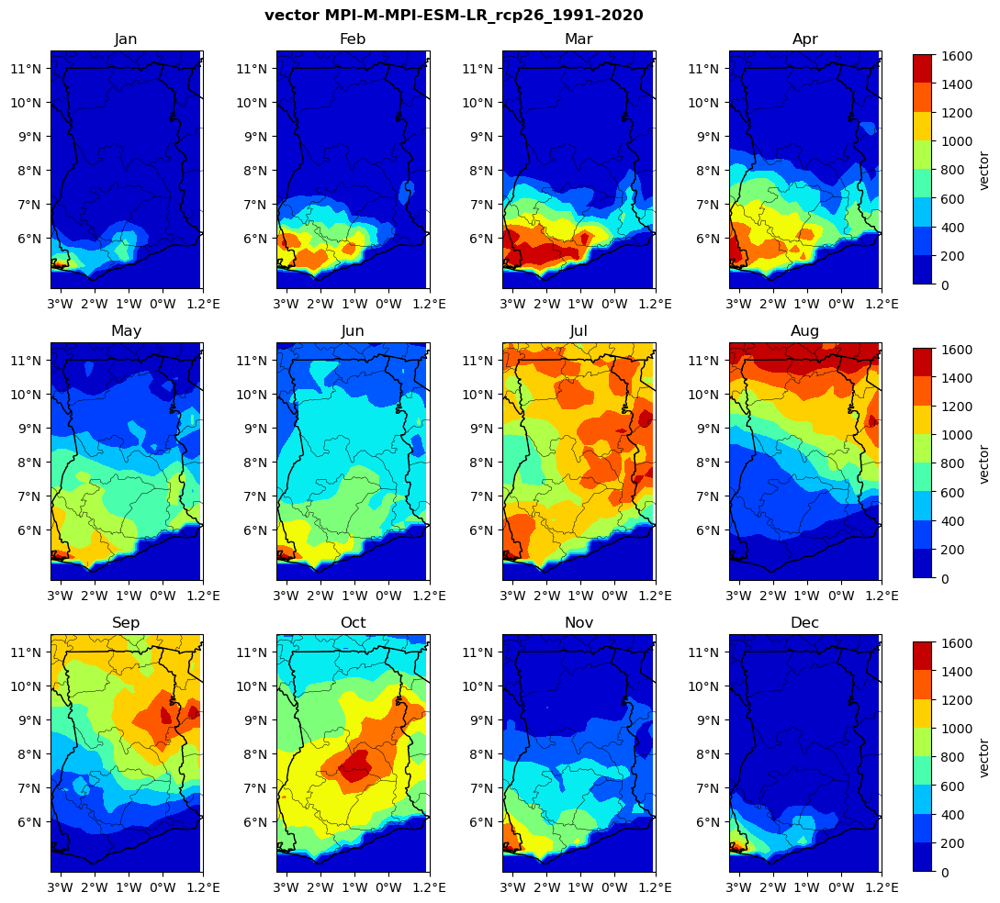

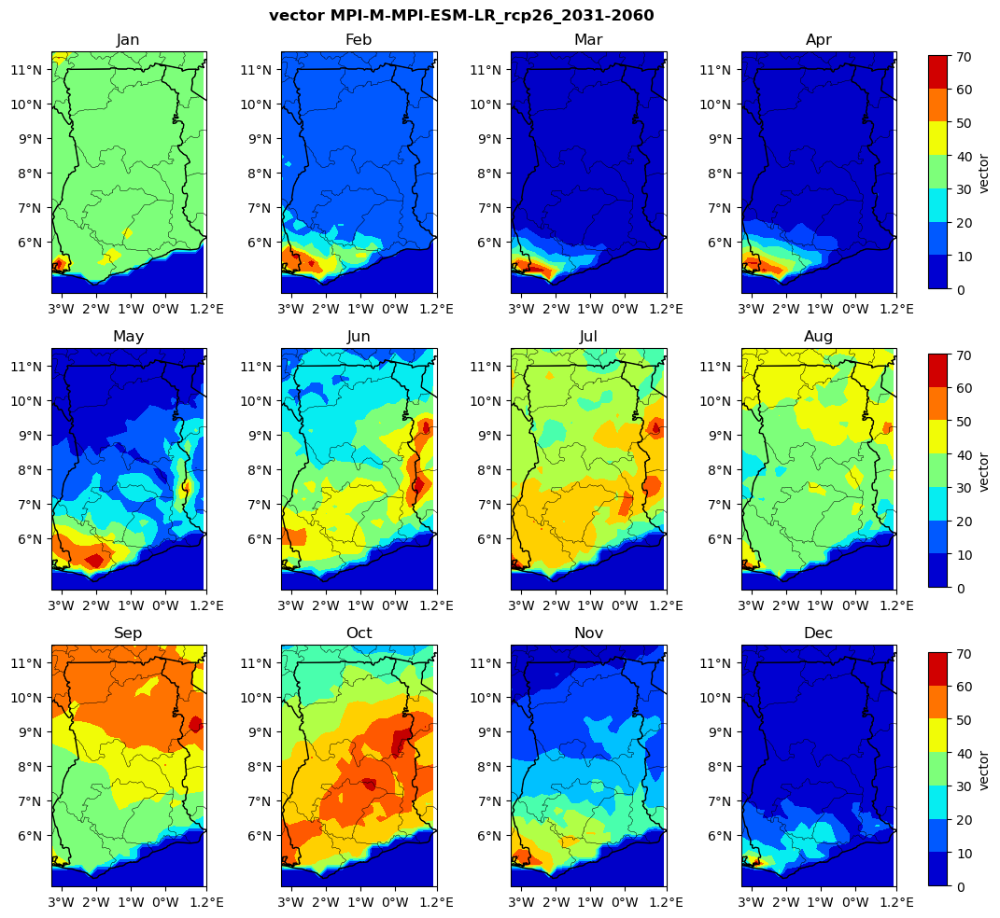

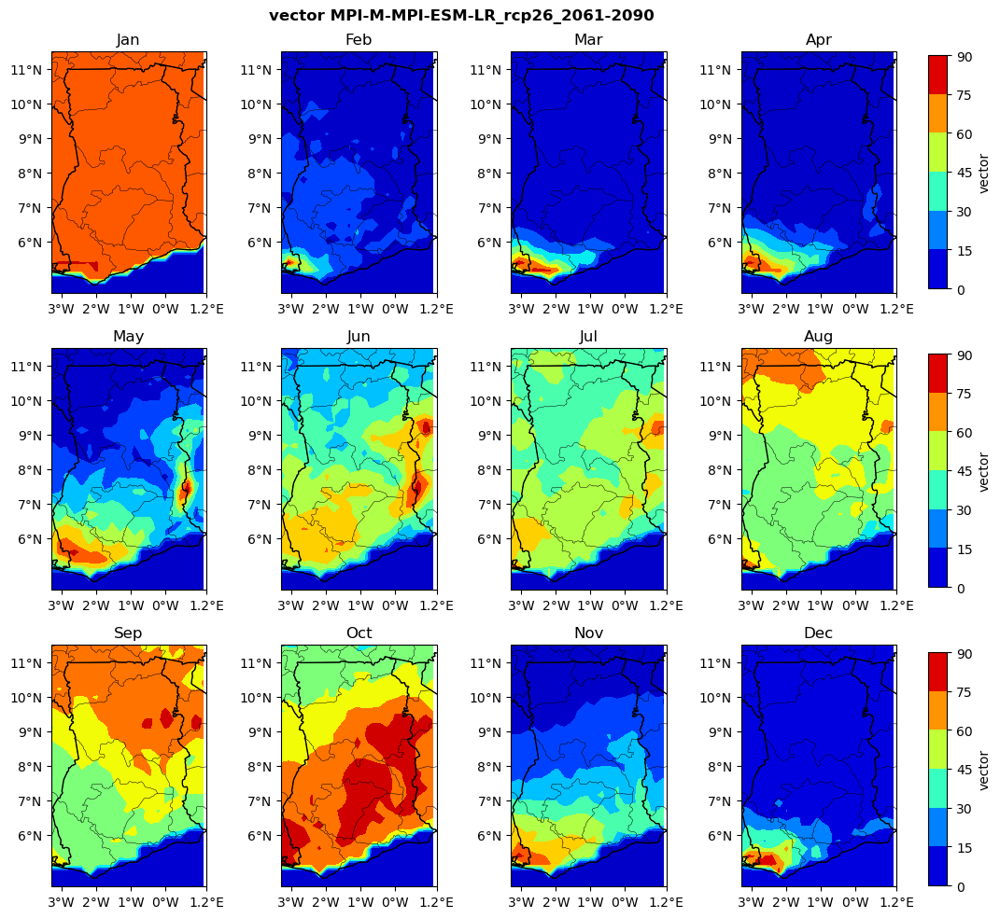

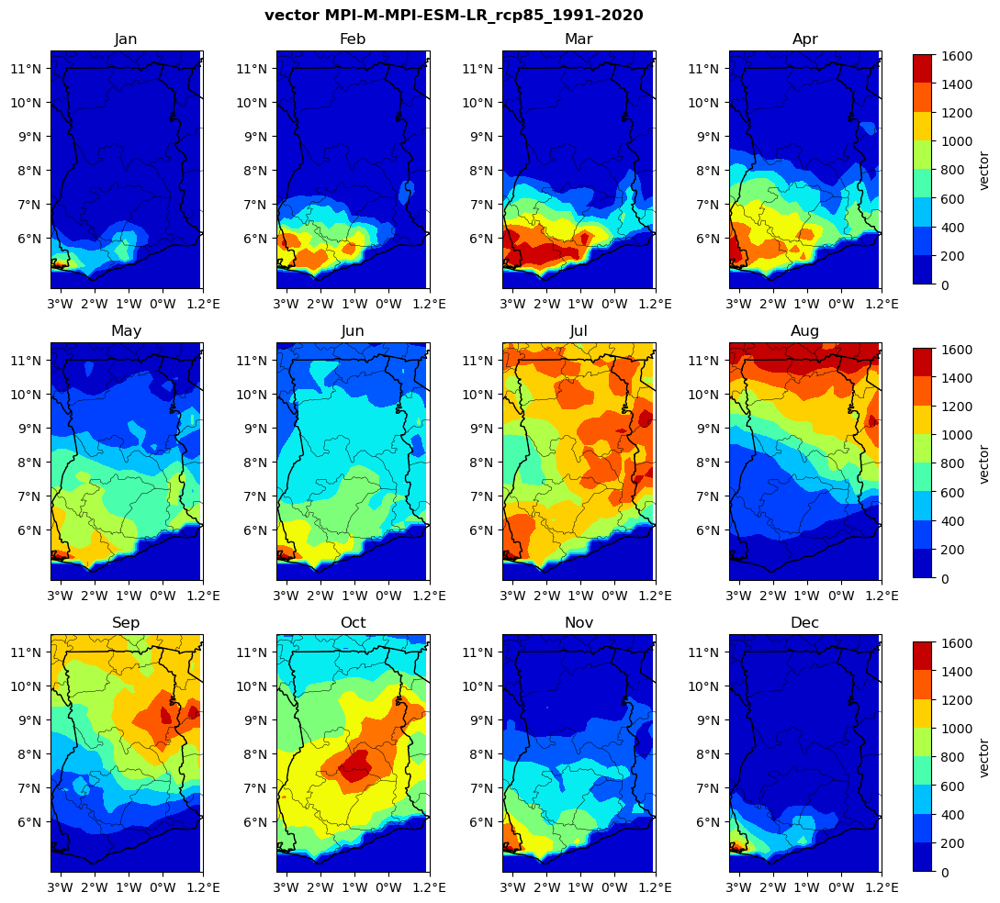

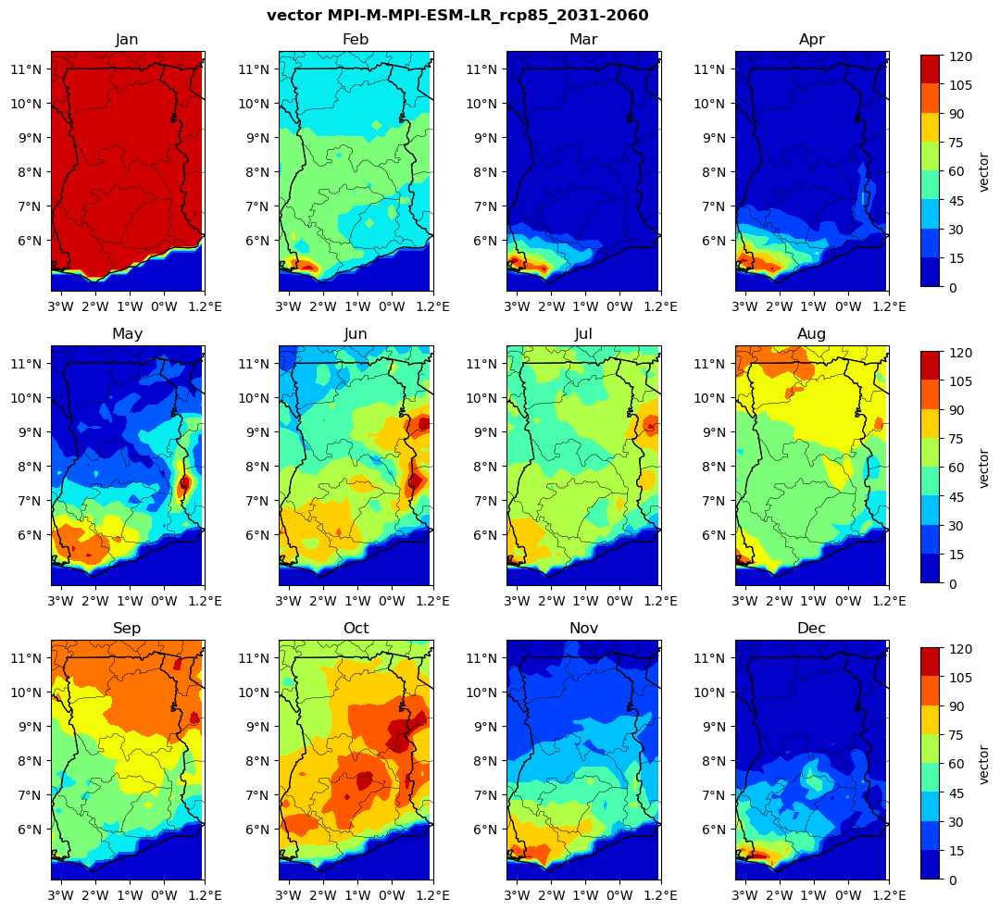

...

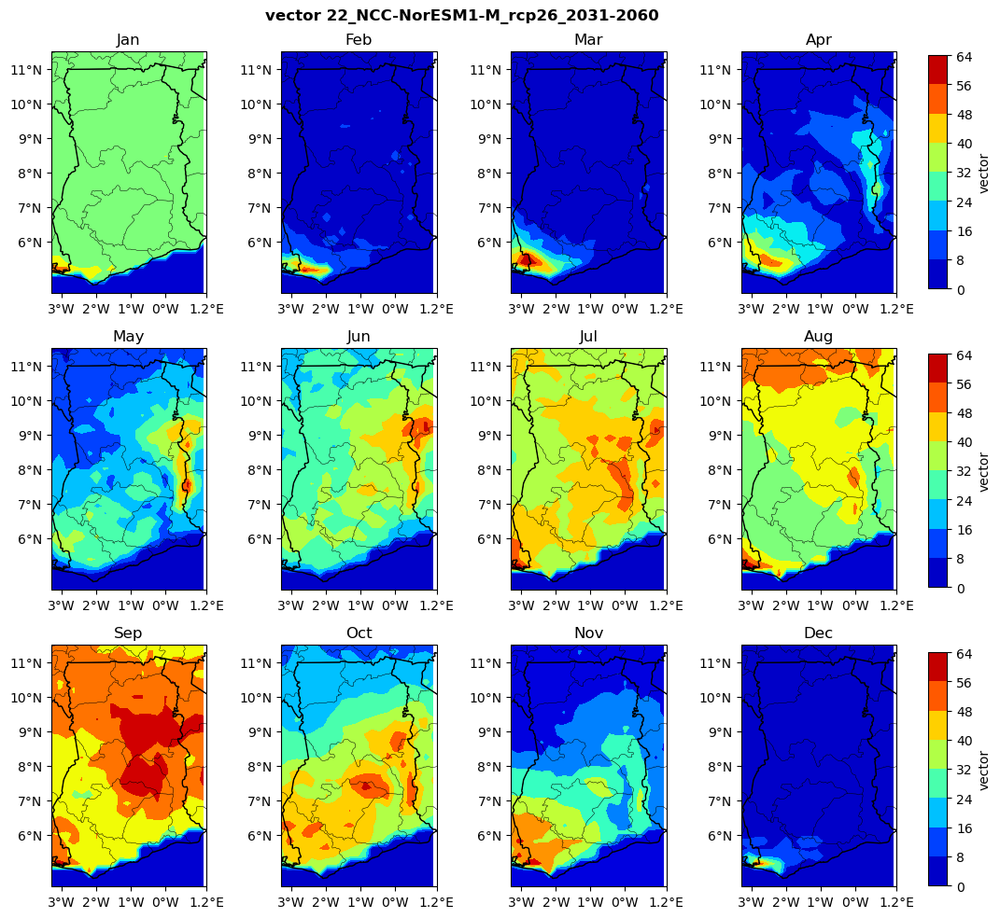

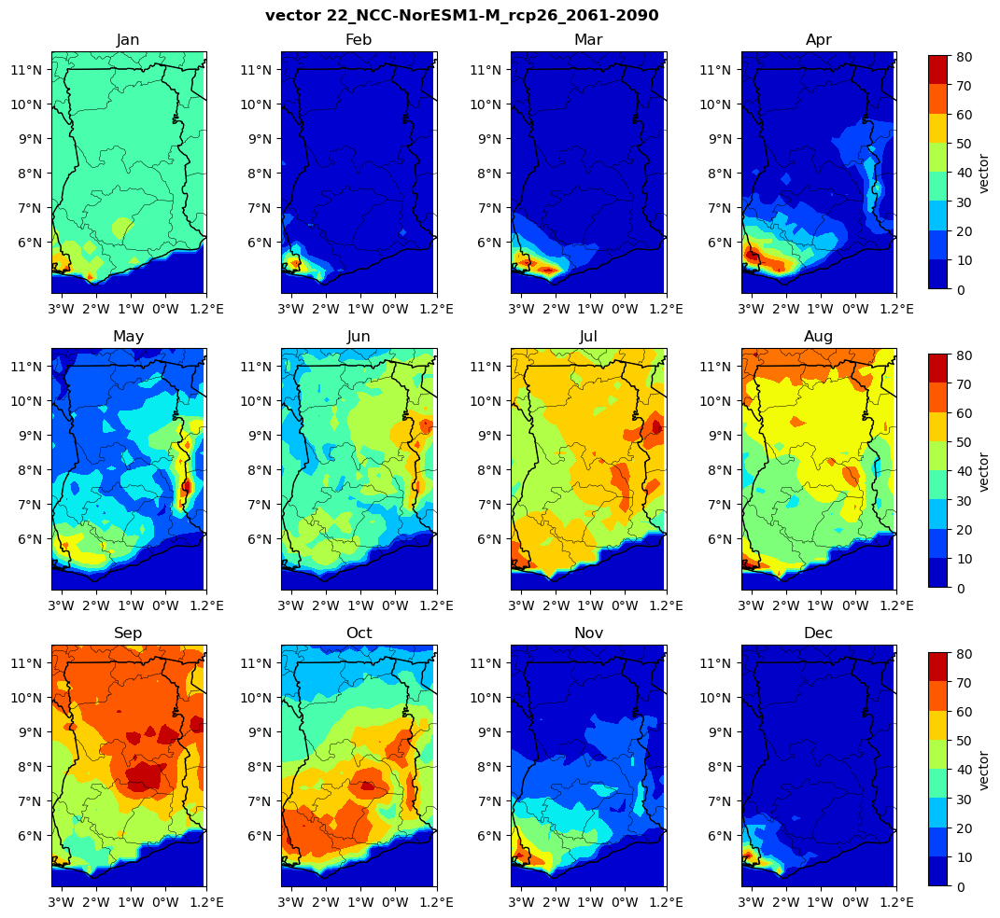

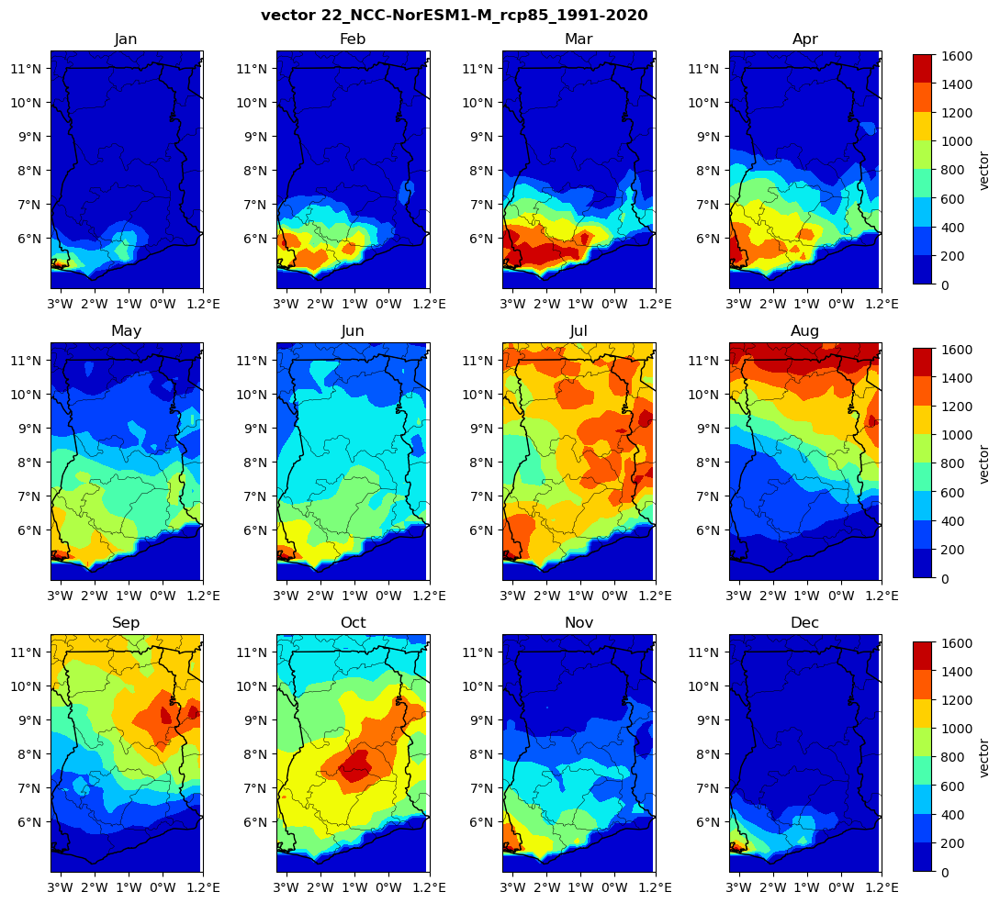

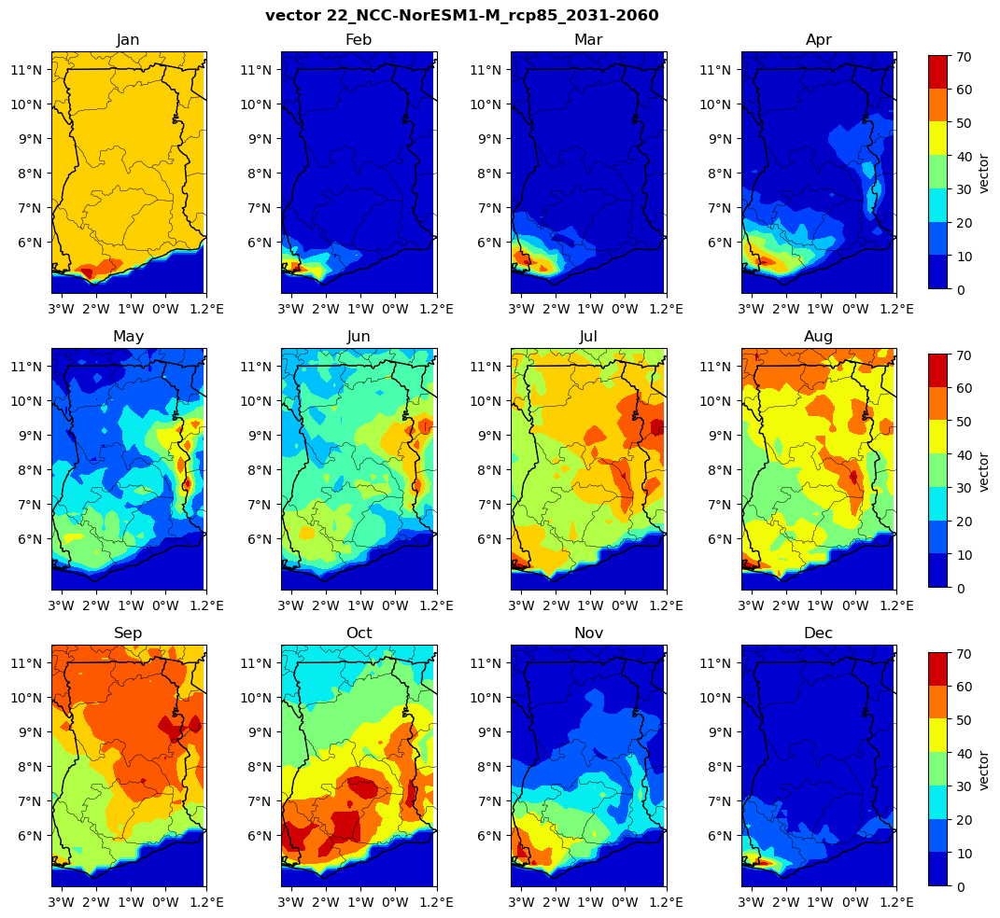

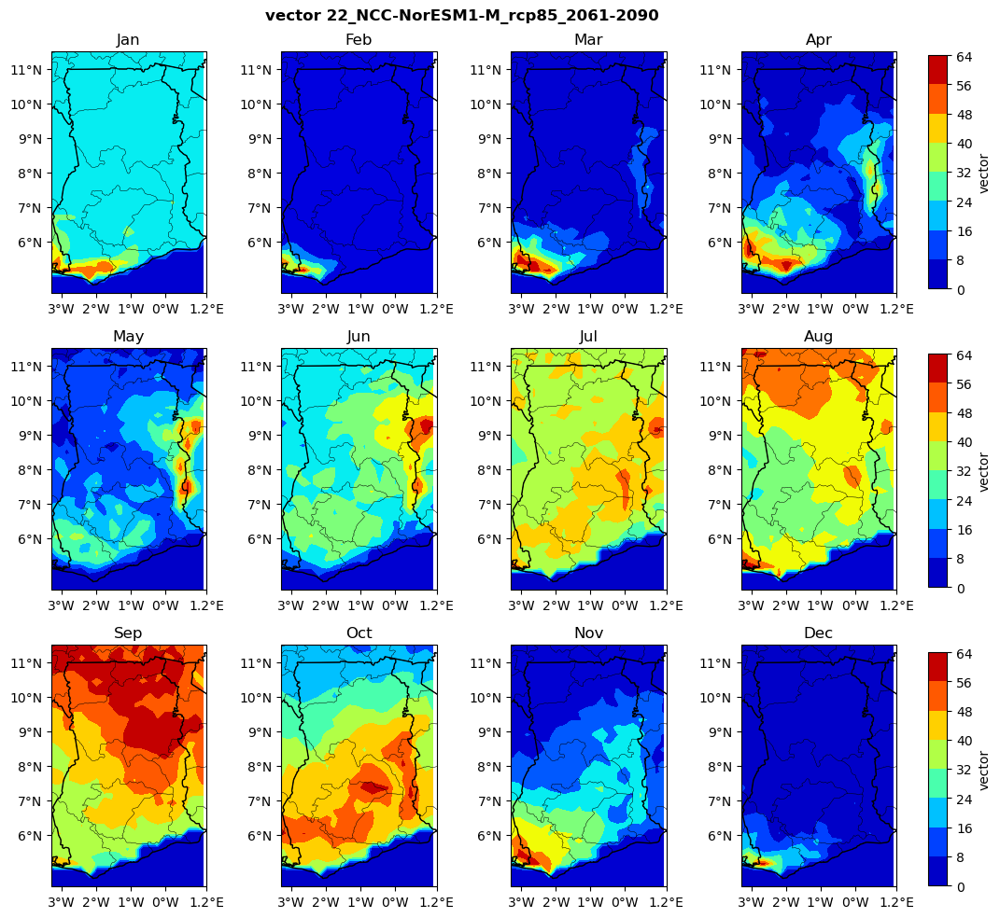

In [63]:
_plt_('vector')

/tmp/ipykernel_37532/2865206530.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_37532/2865206530.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_37532/2865206530.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_37532/2865206530.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_37532/2865206530.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_37532/2865206530.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results mig

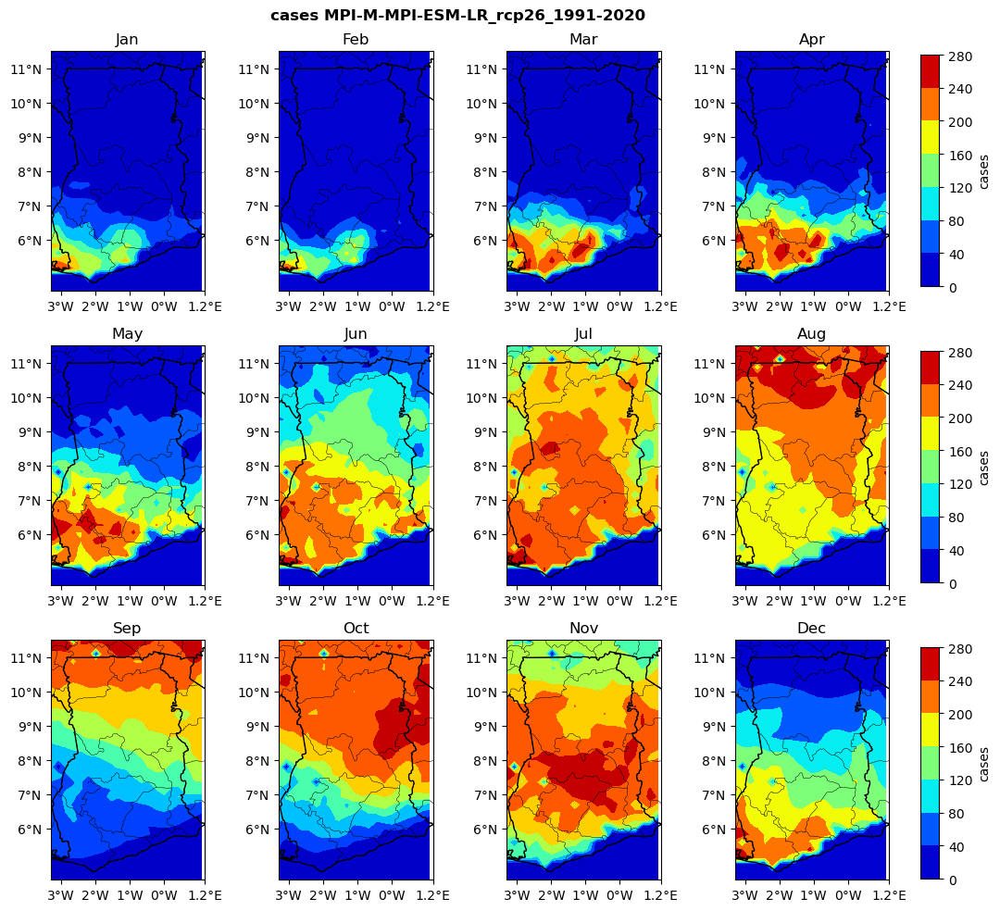

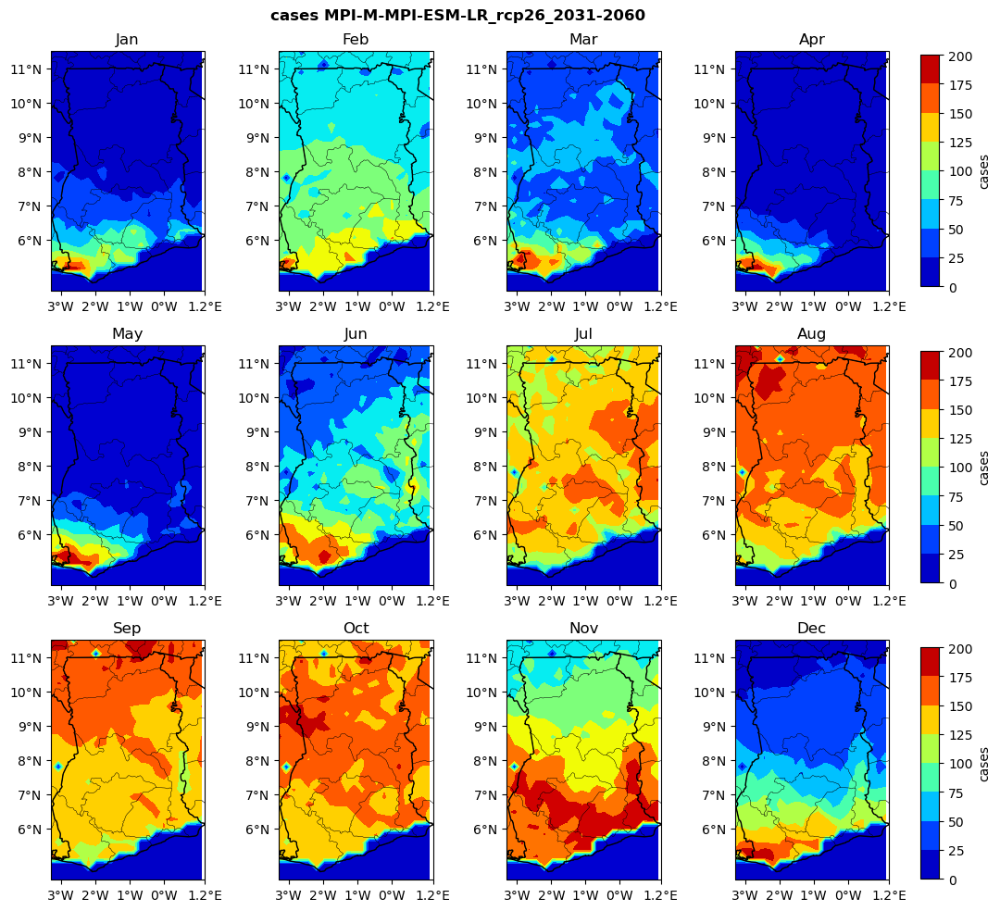

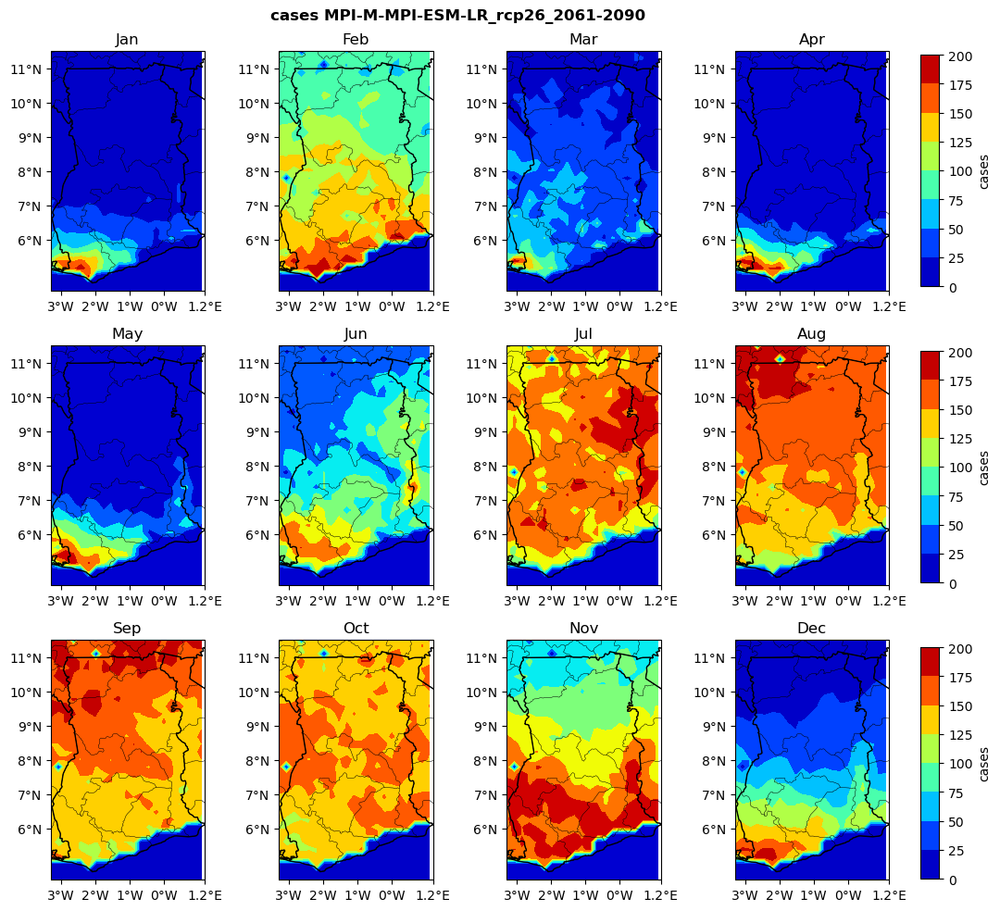

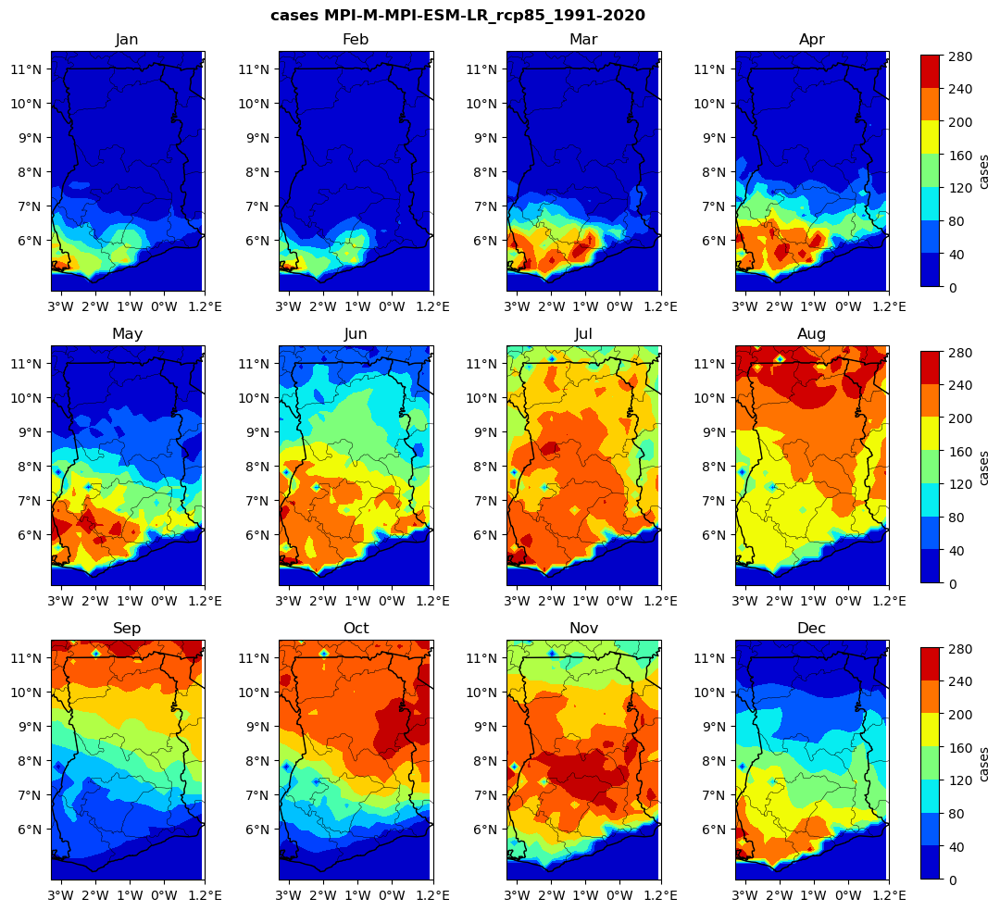

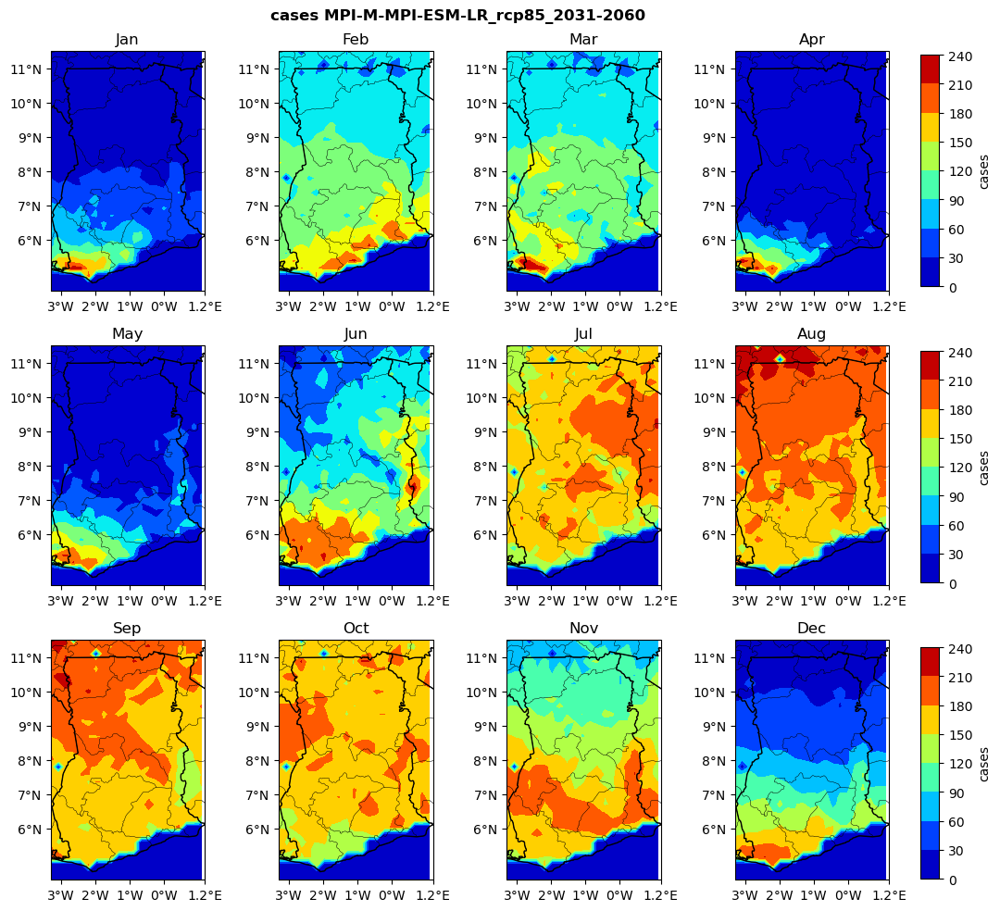

...

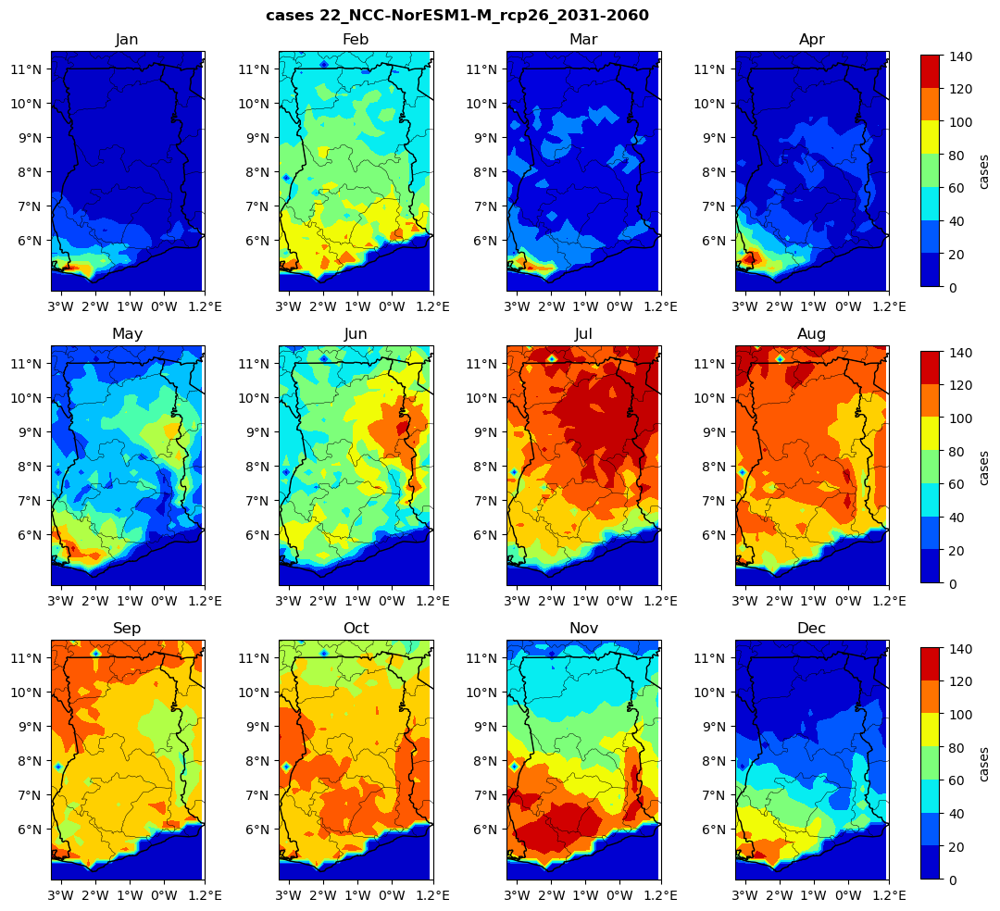

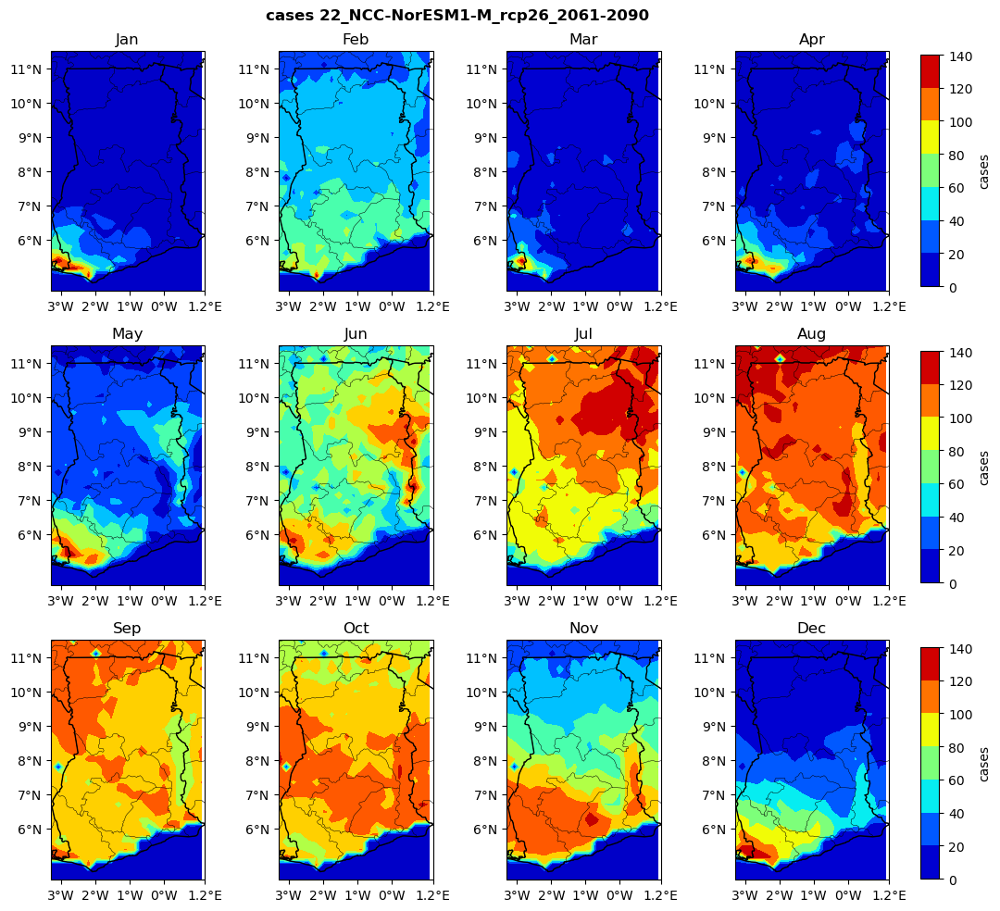

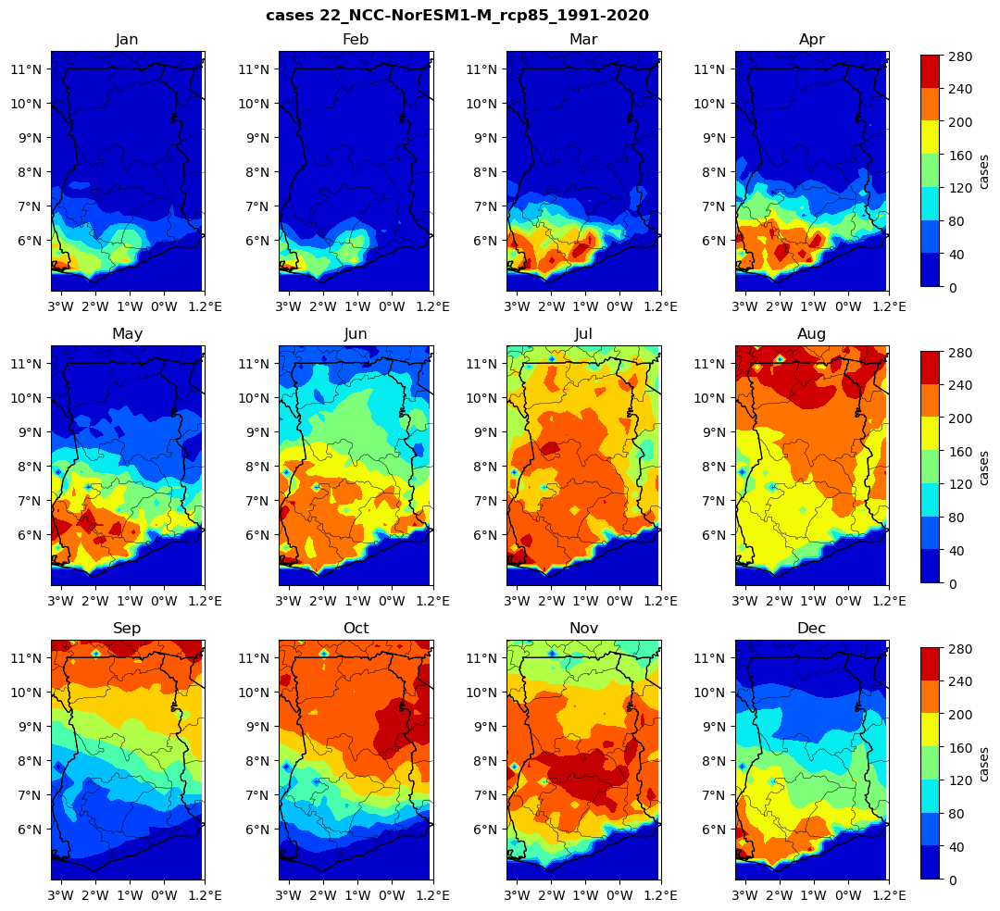

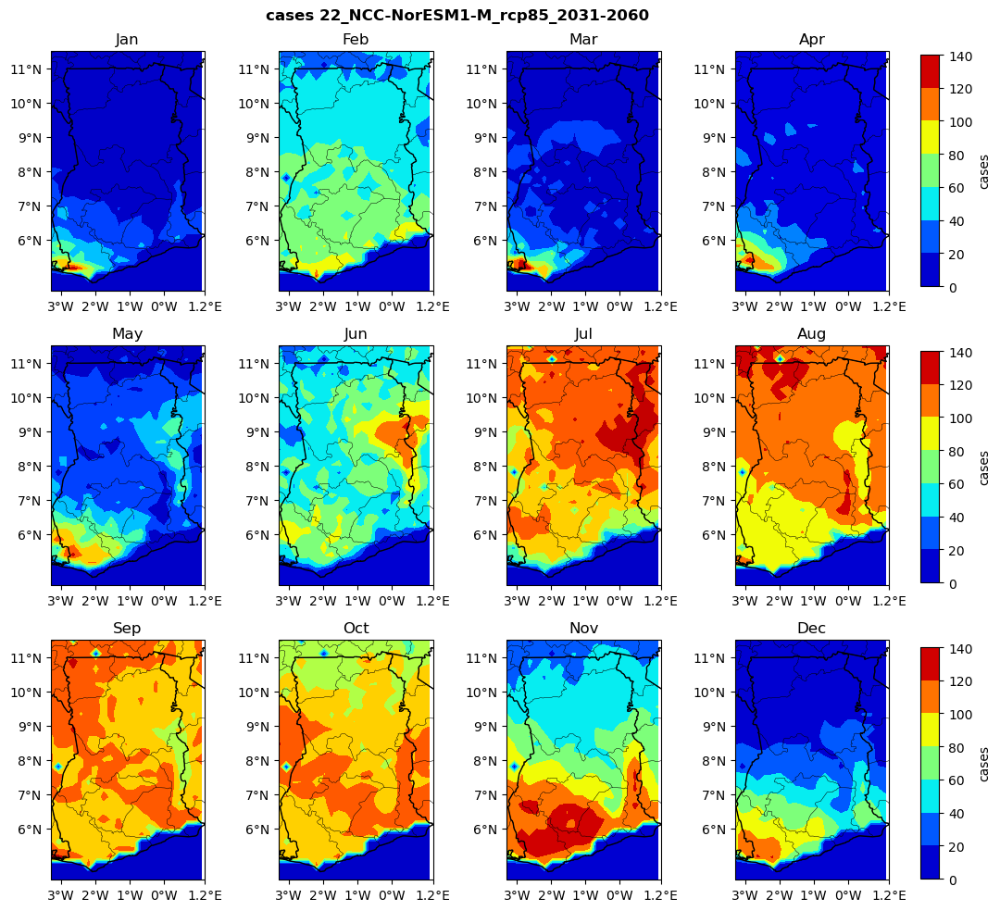

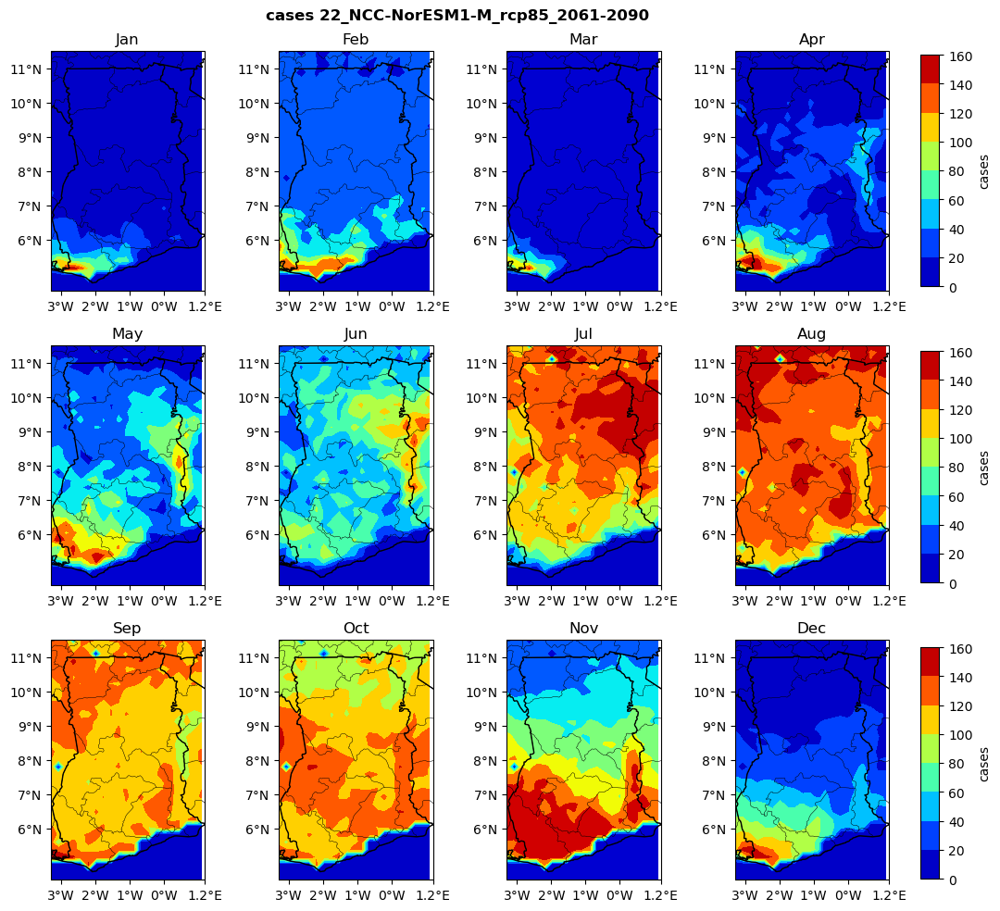

In [64]:
_plt_('cases')

/tmp/ipykernel_37532/1762901964.py:26: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


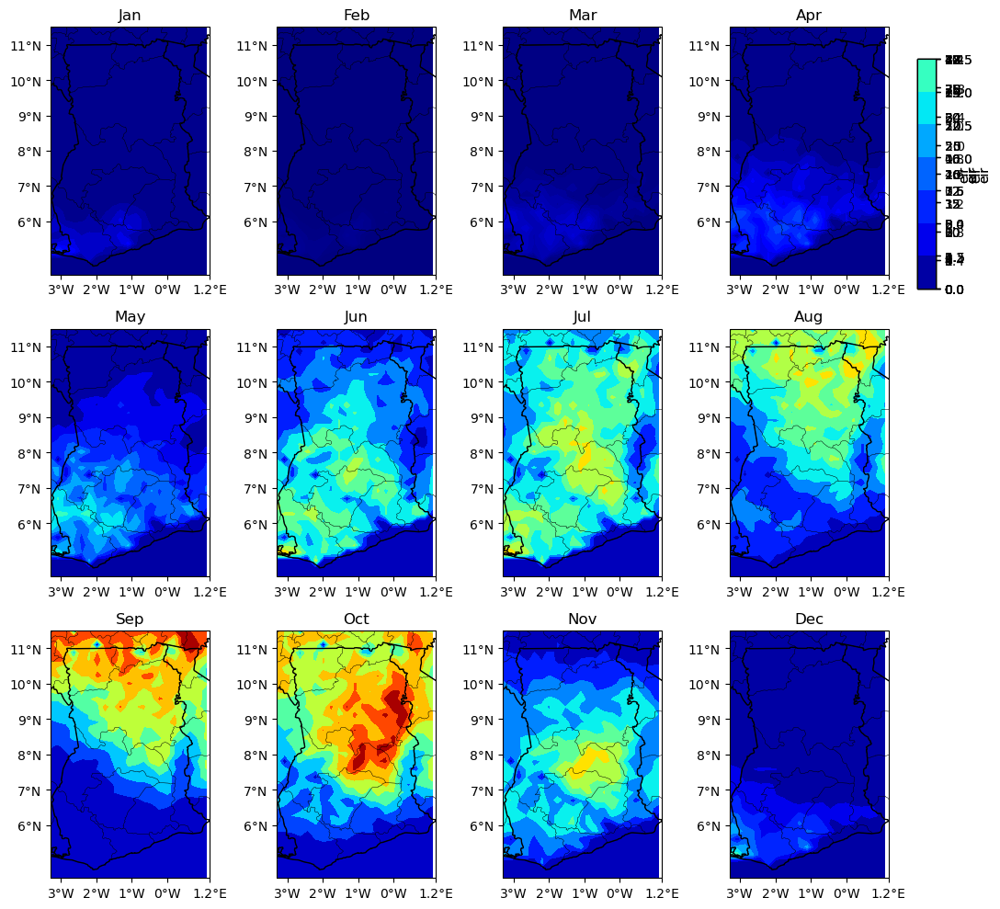

In [132]:
_plt_('eir')